
# "Butterfly Classifier"
>"Using Computer Vision  to classify Butterflies into their respective species "

- toc: true
- branch: master
- badges: true
- comments: true
- categories: [Computer vision, jupyter]
- search_exclude: true




**Description**

Butterflies are insects in the macrolepidopteran clade Rhopalocera from the order Lepidoptera, which also includes moths. Adult butterflies have large, often brightly coloured wings, and conspicuous, fluttering flight

There are over 12000  species of butteflies across the  world .In this notebook  we are going to buld a computer vision software that can classify the butterflies from around 52 common species 

##Getting the data 

In [1]:
#hide
key='283e9d7f297949e68a0bf24c066c0876'

In [ ]:
#Importing the required libraries 
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

In [3]:
from fastbook import *
from fastai.vision.widgets import *

We are going todownload the images from bing image search using the Api key above and store them in a directory on google drive

In [4]:
species=('Monarch butterfly','Painted lady butterfly','Cabbage white butterfly','Red admiral butterfly','Large white butterfly','Old world swallowtail butterfly','Speckled wood butterfly','Eastern tiger swallowtail butterfly','Green-veined white butterfly','Orange-tip butterfly','Mourning cloak butterfly','Common blue butterfly','Glanville fritillary butterfly','Peacock butterfly','Gulf fritillary butterfly','Small copper buttefly','Clouded yellow butterfly','Meadow brown butterfly','Pipevine swallowtail butterfly','Common buckeye butterfly','Small tortoiseshell butterfly','Cloudless sulphur butterfly','Common brimstone butterfly','Large blue butterfly','Holly blue butterfly','Gatekeeper butterfly','Marsh fritillary butterfly','Chequered skipper butterfly','Ringlet butterfly','Silver-studded blue butterfly','Great spangled fritillary butterfly','Postman butterfly','Postman butterfly','Grizzled skipper butterfly','Green hairstreak butterfly','Comma  butterfly','Wood white butterfly','Black swallowtail butterfly','Large skipper butterfly','Large heath butterfly','Zebra Longwing Butterfly','Common wood-nymph butterfly','Clouded sulphur butterfly','American lady butterfly','Small blue butterfly','Adonis blue butterfly','Duke of burgundy butterfly','Small skipper butterfly ','Edith s checkerspot butterfly','Grayling butterfly','Brown argus butterfly','Brown hairstreak butterfly')

In [5]:
len(species)

52

We Will collect pictures of 52 different species of butterflies

In [6]:
path=Path('species')

In [7]:
if not path.exists():
  path.mkdir()
  for o in species:
    dest = (path/o)
    dest.mkdir(exist_ok=True)
    results = search_images_bing(key, f'{o}')
    download_images(dest, urls=results.attrgot('content_url'))

In [8]:
butterflies=get_image_files(path)

In [9]:
butterflies

(#7575) [Path('species/Holly blue butterfly/00000011.jpg'),Path('species/Holly blue butterfly/00000065.jpg'),Path('species/Holly blue butterfly/00000105.jpg'),Path('species/Holly blue butterfly/00000103.jpg'),Path('species/Holly blue butterfly/00000031.jpg'),Path('species/Holly blue butterfly/00000136.jpg'),Path('species/Holly blue butterfly/00000070.jpeg'),Path('species/Holly blue butterfly/00000099.jpg'),Path('species/Holly blue butterfly/00000008.jpg'),Path('species/Holly blue butterfly/00000045.jpg')...]

From  the above we can see we have 7575 pictures of presumably 52 different species of buutterflies 

From each species we have presumably 150 pictures 

But this might not be the case since some pictures can get corrupted during the download .... in the next section  we will check for those and remove them

In [11]:
failed=verify_images(butterflies)

In [12]:
failed

(#67) [Path('species/Holly blue butterfly/00000147.jpg'),Path('species/Postman butterfly/00000144.jpg'),Path('species/Postman butterfly/00000068.jpg'),Path('species/Monarch butterfly/00000116.png'),Path('species/Monarch butterfly/00000042.jpg'),Path('species/Monarch butterfly/00000078.jpg'),Path('species/Monarch butterfly/00000130.png'),Path('species/Orange-tip butterfly/00000137.jpg'),Path('species/Grayling butterfly/00000011.jpg'),Path('species/Grayling butterfly/00000043.jpg')...]

From  the above we can see that 67 images were corrupted  


So I will delet them in the next code cell

In [13]:
failed.map(Path.unlink);

Done 



I will then create an Image Dataloader in the next code cell

In [14]:
species_blk=DataBlock(
    blocks=(ImageBlock,CategoryBlock),
get_items=get_image_files,
splitter=RandomSplitter(seed=42,valid_pct=0.2),
get_y=parent_label,
item_tfms=RandomResizedCrop(128,min_scale=0.3),
batch_tfms=aug_transforms())


In [15]:
dls=species_blk.dataloaders(path)

Lets take a look on some of the items in our datablock

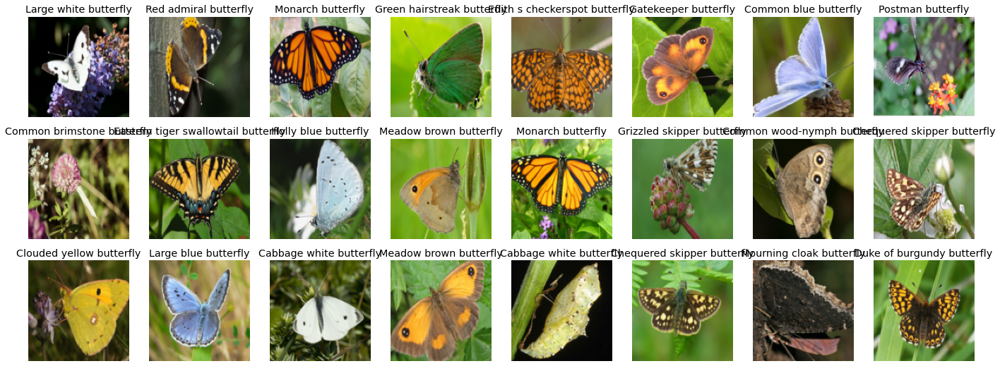

In [17]:
dls.valid.show_batch(max_n=24, nrows=3)

NOW that we have our butterflies with their correct labels in a format that can be taken by a CNN learner 

we will train with different predefined architectures and see how our accuracy behaves 



In [18]:
learn=cnn_learner(dls,resnet18,metrics=error_rate)

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


In [19]:
learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,error_rate,time
0,3.744991,1.740872,0.475683,02:58
1,2.163244,1.263047,0.353764,02:59
2,1.631400,1.175092,0.330446,02:59
3,1.429791,1.160364,0.323118,02:59


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency e

so with the reenet18 we could classify the butterflies correctly  70 percent of time 

Meaning out of 100 butterflies the model saw we got 70 of them right and only missed 30 ... Thats good for a start but not impressive 

Let me take a look at the butterflies we missclassified .... So that i can see if this low accuracy can be justified 

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


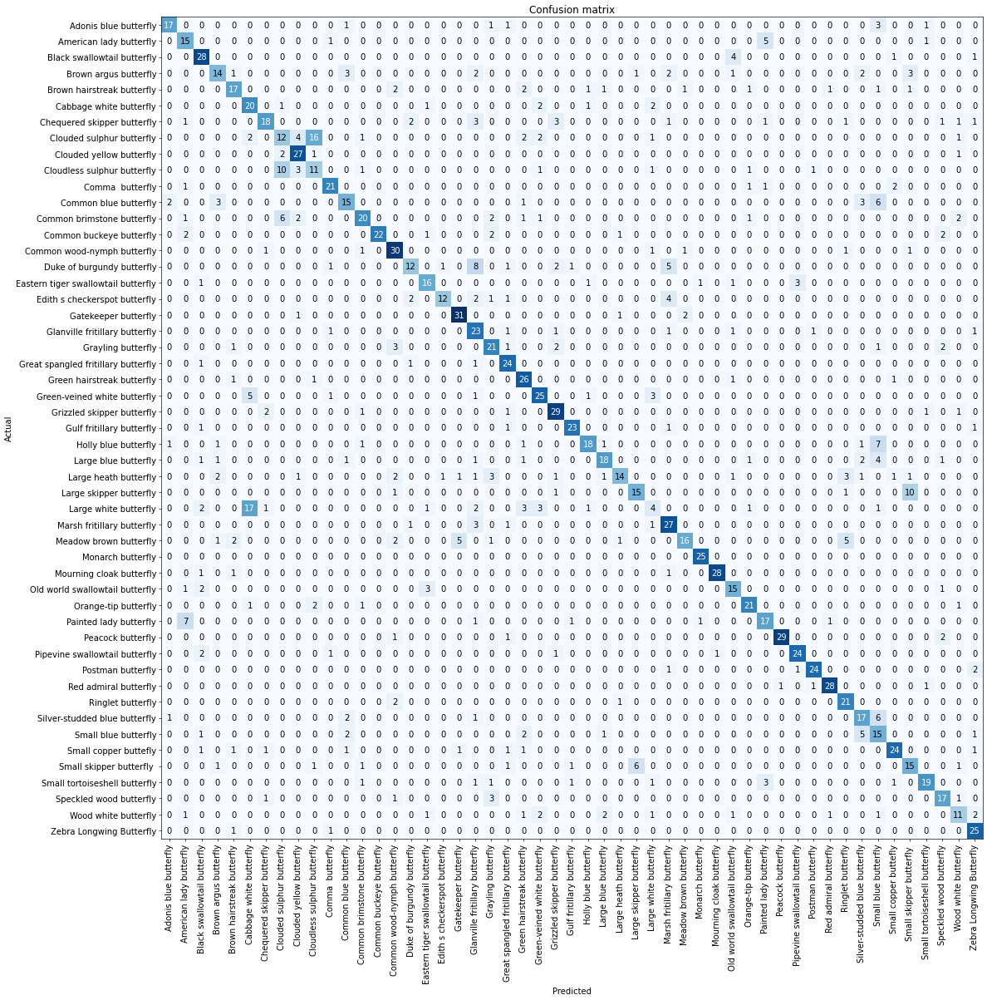

In [20]:
#Confusion Matrix

missed = ClassificationInterpretation.from_learner(learn)
missed.plot_confusion_matrix(figsize=(20,20), dpi=60)

That did not work well for us we have alot of classes lets just see 10 most confused butterflies

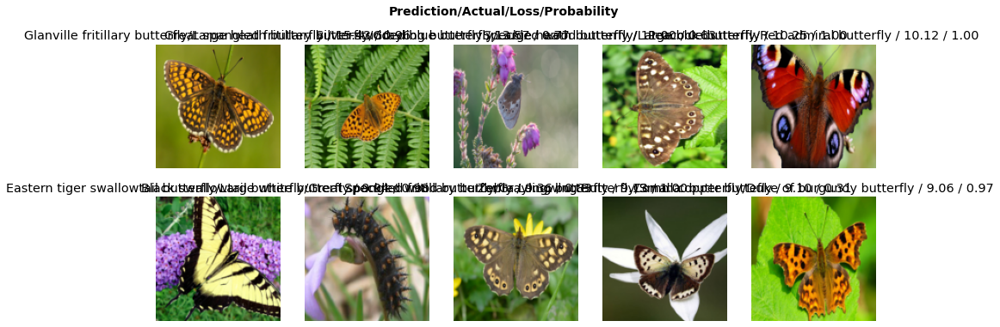

In [23]:
missed.plot_top_losses(10, nrows=2)

from  the above we can See  that in our dataset there are pictures caterpillars.Ofcourse they finally turn into butterflies but for now they are noise in our dataset


so we are going to do some data cleaning then look fit with a different architecture and see how our model will perform 

we are also going to fine tune the model  now

In [22]:
cleaner = ImageClassifierCleaner(learn)
cleaner

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


Going through  all the 54 species istaking alot of time and my computeris slow but i have learnt that there are alot of caterpillr pictures in the photos and for this model toperform well we should remove all of them


maybe iwill when i get a computer witha faster GPU hehehehehehe 

I have removed some in the first five species though

In [24]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()

In [25]:
# retraining the model
species_blk =species_blk.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms()
)


In [26]:
##We will use resnet50 on this  and fine tune

dls = species_blk.dataloaders(path)

learn = cnn_learner(dls, resnet50, metrics=error_rate)
learn.fine_tune(10)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


epoch,train_loss,valid_loss,error_rate,time
0,2.228021,1.179149,0.318000,03:25


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


epoch,train_loss,valid_loss,error_rate,time
0,1.003712,0.815354,0.234000,03:25
1,0.812181,0.802574,0.215333,03:26
2,0.744235,0.886434,0.222667,03:29
3,0.626339,0.773700,0.210000,03:30
4,0.462361,0.743304,0.203333,03:30
5,0.344848,0.710415,0.171333,03:33
6,0.258234,0.724652,0.182667,03:32
7,0.177601,0.723003,0.181333,03:30
8,0.142203,0.701245,0.170667,03:31
9,0.131940,0.692843,0.172000,03:31


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency e

We managed an error rate of 0.182667 

This  means that our model was able to correctly classify approximately 82 butterflies correctly when given a set of 100 butterfly pictures

let me find the learning rate (suitable) then train for a few epochs and see if it does better

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


SuggestedLRs(lr_min=6.309573450380412e-08, lr_steep=2.75422871709452e-06)

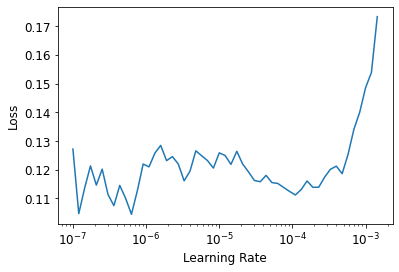

In [27]:
learn.lr_find()

The learning rate  between -06  and -04  gave a relatively low loss and was much stable 

In [28]:
learn.unfreeze()

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


SuggestedLRs(lr_min=9.12010818865383e-08, lr_steep=7.585775847473997e-07)

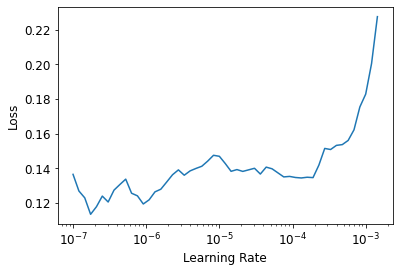

In [29]:
learn.lr_find()

In [ ]:
learn.fit_one_cycle(4, lr_max=1e-4)

epoch,train_loss,valid_loss,error_rate,time
0,0.188498,0.969309,0.220000,03:23
1,0.277922,0.751117,0.191333,03:25
2,0.201708,0.719304,0.186667,03:25
3,0.151041,0.713913,0.180000,03:27


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency e

Well the fine tuning and the resnet50  sprinkled some little accuracy on top  what we had 

#Making The Actual Classification

##Using the Model for Inference

In [30]:
learn.export()

In [31]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [32]:
learn_inf = load_learner(path/'export.pkl')

In [33]:
learn_inf.dls.vocab

(#51) ['Adonis blue butterfly','American lady butterfly','Black swallowtail butterfly','Brown argus butterfly','Brown hairstreak butterfly','Cabbage white butterfly','Chequered skipper butterfly','Clouded sulphur butterfly','Clouded yellow butterfly','Cloudless sulphur butterfly'...]

##Creating a Notebook App from the Model

In [34]:
# creating upload and classify widgets
btn_upload = widgets.FileUpload()
btn_run = widgets.Button(description='Classify')
lbl_pred = widgets.Label()
out_pl = widgets.Output()

# creating the on click listener
def on_click_classify(change):
  img = PILImage.create(btn_upload.data[-1])
  out_pl.clear_output()
  with out_pl:
    display(img.to_thumb(128, 128))
  pred, pred_idx, probs = learn.predict(img)
  lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [35]:
#hide
#Putting back btn_upload to a widget for next cell
btn_upload = widgets.FileUpload()

In [36]:
# creating a VBox
VBox([widgets.Label('Upload Your Butterfly'),
      btn_upload, btn_run, out_pl, lbl_pred])